## Задача 1

Фотографии решения отправила вместе с .ipynb файлом.

![page 1](page1.png)
![page 2](page2.png)
![page 3](page3.png)

In [483]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, LogisticRegression
import statsmodels as sm
import scipy.stats as sps

from sklearn.cross_validation import train_test_split
from sklearn.decomposition import PCA, TruncatedSVD, IncrementalPCA, KernelPCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import confusion_matrix, accuracy_score, log_loss
from sklearn.manifold import TSNE, Isomap
from sklearn.cross_validation import KFold

from pylab import cm

from scipy.stats import f
import seaborn as sns
import copy
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
warnings.simplefilter("ignore")

## Задача 2 

In [570]:
data = pd.read_excel('hw11t2_train.xlsx')
data.head()

,PROJECT DATES (PERSIAN CALENDAR),Unnamed: 1,Unnamed: 2,Unnamed: 3,PROJECT PHYSICAL AND FINANCIAL VARIABLES,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 99,Unnamed: 100,Unnamed: 101,Unnamed: 102,Unnamed: 103,Unnamed: 104,Unnamed: 105,Unnamed: 106,OUTPUTS,Unnamed: 108
0,START YEAR,START QUARTER,COMPLETION YEAR,COMPLETION QUARTER,V-1,V-2,V-3,V-4,V-5,V-6,...,V-22,V-23,V-24,V-25,V-26,V-27,V-28,V-29,V-9,V-10
1,81,1,85,1,1,3150,920,598.5,190,1010.84,...,815.5,1755,8002,60.74,54.26,2978.26,41407,601988,2200,410
2,84,1,89,4,1,7600,1140,3040,400,963.81,...,1316.3,8364.78,8393,90.95,89.79,11379.4,44835,929027,5000,1000
3,78,1,81,4,1,4800,840,480,100,689.84,...,765.8,1755,4930,38.7,32.04,1653.06,37933,377829,1200,170
4,72,2,73,2,1,685,202,13.7,20,459.54,...,152.25,1442.31,1456,9.73,8.34,686.16,8194,122032,165,30


In [571]:
data = data.iloc[1:]
ind_test = np.where(data.isnull().values[:,-1])
ind_train = np.where(data.isnull().values[:,-1] == False)
train_data = data.iloc[ind_train]
test_data = data.iloc[ind_test]

In [572]:
train_targets = train_data.iloc[:,-2:]
test_targets = test_data.iloc[:,-2:]
train_data = train_data.iloc[:,:-2]
test_data = test_data.iloc[:,:-2]

Перед тем, как применять PCA посмотрим на матрицу корреляций. Так как если признаки сильно коррелируют, то один из них стоит удалить

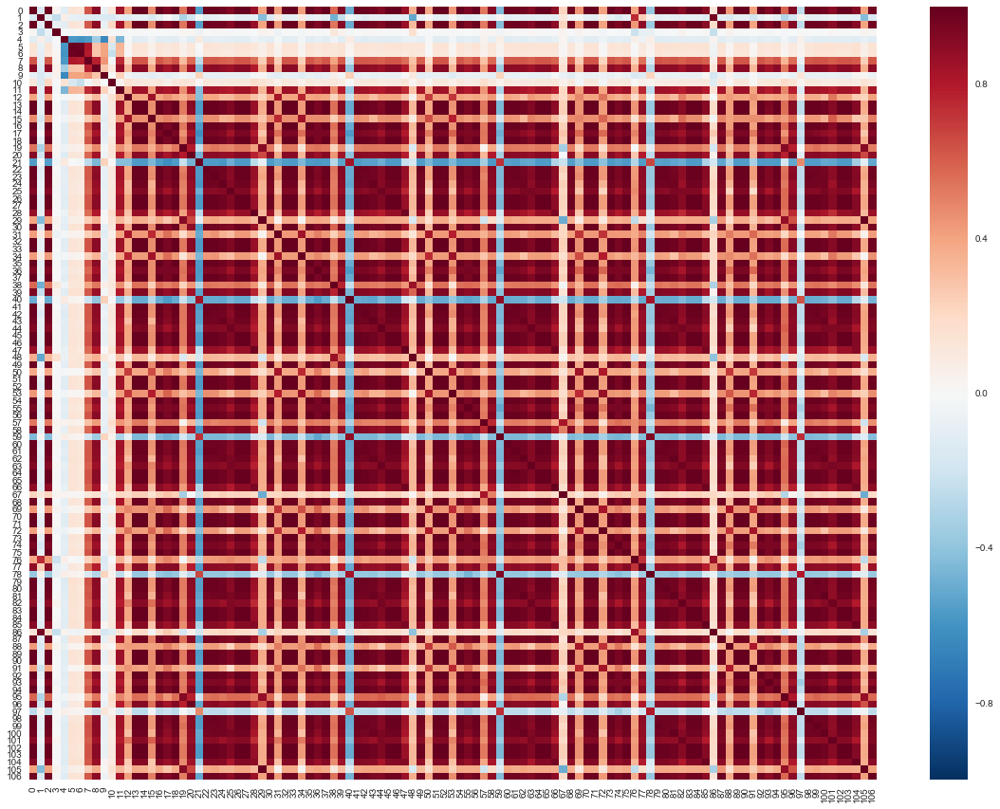

In [30]:
train_data = np.array(train_data, dtype=float)
train_data = pd.DataFrame(train_data)
R = train_data.corr(method='spearman')
plt.figure(figsize=(20, 15))
sns.heatmap(R, vmin=-1, vmax=1, cmap='RdBu_r');

Как видим, некоторые признаки сильно коррелируют. Посмотрим на пары признаков, корреляция между которыми > 0.95

In [574]:
train_data = np.array(train_data)
test_data = np.array(test_data)
for i in range(train_data.shape[1]):
    for j in range(i + 1, train_data.shape[1]):
        corr = sps.spearmanr(train_data[:,i], train_data[:,j])[0]
        if corr > 0.95:
            print('correlation between {} {} - {}'.format(i, j, corr))

correlation between 0 2 - 0.9872921334697394
correlation between 0 13 - 0.9977062629021582
correlation between 0 14 - 0.995567571351411
correlation between 0 16 - 0.9977062629021582
correlation between 0 18 - 0.9975789598336614
correlation between 0 22 - 0.9873773548445722
correlation between 0 23 - 0.9860125293615135
correlation between 0 24 - 0.969563385361518
correlation between 0 26 - 0.9977062629021582
correlation between 0 27 - 0.9977062629021582
correlation between 0 30 - 0.9826549896536503
correlation between 0 32 - 0.9977062629021582
correlation between 0 33 - 0.9958563178567745
correlation between 0 35 - 0.9977062629021582
correlation between 0 37 - 0.9976368248647964
correlation between 0 41 - 0.9920213129183066
correlation between 0 42 - 0.9859211068741326
correlation between 0 43 - 0.9682635129821451
correlation between 0 45 - 0.9977062629021582
correlation between 0 46 - 0.9977062629021582
correlation between 0 49 - 0.97742948801701
correlation between 0 51 - 0.9977062629

correlation between 16 74 - 0.9500026701190585
correlation between 16 75 - 0.9998522053018464
correlation between 16 79 - 0.9894453801888713
correlation between 16 80 - 0.9880199922306482
correlation between 16 81 - 0.9726229056603225
correlation between 16 83 - 0.9996155028555843
correlation between 16 84 - 0.9997488644777466
correlation between 16 87 - 0.9745261981978862
correlation between 16 89 - 0.9998891539763847
correlation between 16 90 - 0.99766646027368
correlation between 16 92 - 0.9998400815180133
correlation between 16 94 - 0.9998192978885855
correlation between 16 98 - 0.9877434318679432
correlation between 16 99 - 0.9881310989850925
correlation between 16 100 - 0.9713739554295041
correlation between 16 102 - 0.9999359171425974
correlation between 16 103 - 0.9999826803088101
correlation between 16 106 - 0.97378202879976
correlation between 17 23 - 0.9505964717466127
correlation between 18 22 - 0.989306822659352
correlation between 18 23 - 0.9892786786847086
correlation be

correlation between 24 89 - 0.9736655320883625
correlation between 24 90 - 0.9701553165646455
correlation between 24 92 - 0.9736619864161163
correlation between 24 94 - 0.9736649411429882
correlation between 24 98 - 0.9672830265725534
correlation between 24 99 - 0.9673663999455606
correlation between 24 100 - 0.9663264531165391
correlation between 24 102 - 0.9740484646909497
correlation between 24 103 - 0.9740963312662733
correlation between 25 44 - 0.9748362206701855
correlation between 25 63 - 0.9501400730024985
correlation between 26 27 - 0.9999792163705721
correlation between 26 30 - 0.981276836500672
correlation between 26 32 - 0.9997367406939136
correlation between 26 33 - 0.9983534746908798
correlation between 26 35 - 0.9997211529718426
correlation between 26 37 - 0.9996986373732958
correlation between 26 41 - 0.9944490389736352
correlation between 26 42 - 0.9863878637198984
correlation between 26 43 - 0.9710456288114245
correlation between 26 45 - 0.9992881606920949
correlation

correlation between 35 37 - 0.9999359171425974
correlation between 35 41 - 0.9951383626829935
correlation between 35 42 - 0.9867862254717263
correlation between 35 43 - 0.9713644613067925
correlation between 35 45 - 0.9997806172449281
correlation between 35 46 - 0.9997863904753247
correlation between 35 49 - 0.9797677140749914
correlation between 35 51 - 0.9999844122779292
correlation between 35 52 - 0.9981219681519745
correlation between 35 54 - 0.9999307212352404
correlation between 35 55 - 0.9510291504835803
correlation between 35 56 - 0.9999509275416286
correlation between 35 60 - 0.9853908404813144
correlation between 35 61 - 0.9921427476941299
correlation between 35 62 - 0.9703474938993246
correlation between 35 64 - 0.9997332767556756
correlation between 35 65 - 0.9999237933587645
correlation between 35 68 - 0.977579082431627
correlation between 35 70 - 0.9999844122779292
correlation between 35 71 - 0.9975671607108578
correlation between 35 73 - 0.9999428450190734
correlation be

correlation between 45 46 - 0.9999942267696035
correlation between 45 49 - 0.9799437976020889
correlation between 45 51 - 0.9997962049669991
correlation between 45 52 - 0.9979337608410442
correlation between 45 54 - 0.999758101646381
correlation between 45 55 - 0.9514199981814325
correlation between 45 56 - 0.9997627202306983
correlation between 45 60 - 0.9853562010989346
correlation between 45 61 - 0.9917160964845636
correlation between 45 62 - 0.9701368329329959
correlation between 45 64 - 0.9994348007441696
correlation between 45 65 - 0.9996507195610035
correlation between 45 68 - 0.9767390774089166
correlation between 45 70 - 0.9997962049669991
correlation between 45 71 - 0.9973789533999277
correlation between 45 73 - 0.9997546377081431
correlation between 45 75 - 0.9997592562924603
correlation between 45 79 - 0.9892017498661333
correlation between 45 80 - 0.987952443933599
correlation between 45 81 - 0.9726578583194306
correlation between 45 83 - 0.9995693170124111
correlation bet

correlation between 60 75 - 0.9855969448064741
correlation between 60 79 - 0.9716176447240613
correlation between 60 80 - 0.9856979473526024
correlation between 60 81 - 0.969674441518263
correlation between 60 83 - 0.9855940581912759
correlation between 60 84 - 0.9857274198134383
correlation between 60 87 - 0.9751450884964055
correlation between 60 89 - 0.9856338934810126
correlation between 60 90 - 0.9823402655397322
correlation between 60 92 - 0.9855744292079273
correlation between 60 94 - 0.9854393356166461
correlation between 60 98 - 0.9722850301579125
correlation between 60 99 - 0.9751194295146868
correlation between 60 100 - 0.9683163011039749
correlation between 60 102 - 0.9854052735573059
correlation between 60 103 - 0.9854936039823743
correlation between 60 106 - 0.96461933483726
correlation between 61 62 - 0.9689431323600044
correlation between 61 64 - 0.9922876589980557
correlation between 61 65 - 0.9919193187115829
correlation between 61 68 - 0.9625571709225118
correlation 

correlation between 73 94 - 0.9998885766533451
correlation between 73 98 - 0.987313326203394
correlation between 73 99 - 0.9886830672143126
correlation between 73 100 - 0.9715429341893358
correlation between 73 102 - 0.9998181432425062
correlation between 73 103 - 0.9998649064087188
correlation between 73 106 - 0.9736434712702408
correlation between 74 80 - 0.9534901110493873
correlation between 74 83 - 0.9502711253325022
correlation between 74 89 - 0.9500494332852711
correlation between 74 92 - 0.9502249394893291
correlation between 74 94 - 0.9502994141614455
correlation between 74 102 - 0.9500546291926282
correlation between 74 103 - 0.9501429596176968
correlation between 75 79 - 0.9894401842815143
correlation between 75 80 - 0.988280948044889
correlation between 75 81 - 0.9727153228606765
correlation between 75 83 - 0.9997361633708739
correlation between 75 84 - 0.9998695249930363
correlation between 75 87 - 0.9742906503977035
correlation between 75 89 - 0.9999630513254617
correlati

Как видим, многие признаки очень сильно коррелируют. <br>
Чтобы не удалять все признаки, удалим только те, корреляция которых как минимум с 5ью признаками > 0.97. <br>


In [575]:
ind_not_del = []
for i in range(train_data.shape[1]):
    cnt = 0
    for j in range(i + 1, train_data.shape[1]):
        corr = sps.spearmanr(train_data[:,i], train_data[:,j])[0]
        if corr > 0.96:
            cnt += 1
    if cnt <= 3:
        ind_not_del.append(i)

In [576]:
data_train_new = train_data[:,ind_not_del]
data_test_new = test_data[:,ind_not_del]

Теперь сделаем стандартизацию

In [577]:
data_test_new -= np.mean(data_train_new, axis=0)
data_test_new /= np.std(data_train_new, axis=0)
data_train_new -= np.mean(data_train_new, axis=0)
data_train_new /= np.std(data_train_new, axis=0)

Теперь можно применять PCA.

In [578]:
%%time
pca = IncrementalPCA(n_components=2)
pca.fit(data_train_new)
data_train_pca = pca.transform(data_train_new)
data_test_pca = pca.transform(data_test_new)

CPU times: user 3.8 ms, sys: 1.09 ms, total: 4.89 ms
Wall time: 4 ms


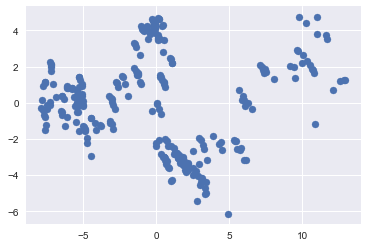

In [116]:
plt.scatter(data_train_pca[:,0], data_train_pca[:,1])

Как видим, получили что-то хорошее

Посмотрим, что получим при отображении не в двумерное пространство.

In [126]:
folds = KFold(len(data_train_new), n_folds=5, shuffle=True, random_state=1)
ns = [10, 15, 20, 25, 30, 35, 40, 45, 48, 50, 52]
rmses1_ns = []
rmses2_ns = []
for n in ns:
    rmses1 = []
    rmses2 = []
    for fold in folds:
        pca = IncrementalPCA(n_components=n)
        pca.fit(data_train_new[fold[0]])
        train = pca.transform(data_train_new[fold[0]])
        test = pca.transform(data_train_new[fold[1]])
        lr1 = LinearRegression()
        lr1.fit(train, np.array(train_targets)[:,0][fold[0]])
        predictions = lr1.predict(test)
        rmses1.append(np.sqrt(mean_squared_error(predictions, np.array(train_targets)[:,0][fold[1]])))
        
        lr2 = LinearRegression()
        lr2.fit(train, np.array(train_targets)[:,1][fold[0]])
        predictions = lr2.predict(test)
        rmses2.append(np.sqrt(mean_squared_error(predictions, np.array(train_targets)[:,1][fold[1]])))
    rmses1_ns.append(np.mean(rmses1))
    rmses2_ns.append(np.mean(rmses2))

In [129]:
rmses1_ns

[744.8316615705367,
 601.570211869124,
 342.2743507665853,
 232.69736050544185,
 226.1136966292519,
 209.6997653077994,
 199.74771435249892,
 196.39129449461603,
 194.92288116235554,
 196.37105732971312,
 199.31462052035675]

In [128]:
rmses2_ns

[61.73244783092021,
 49.75271409208128,
 46.057579074097504,
 48.11860073650537,
 46.38974007846597,
 43.410898395133806,
 39.233330043071156,
 37.843740875334944,
 37.34644426963646,
 37.605541797749005,
 38.25973570563802]

Получили, что на кросс-валидации самой оптимальной размерностью является n = 48. Предсказываем

In [131]:
pca = IncrementalPCA(n_components=n)
pca.fit(data_train_new)

lr1 = LinearRegression()
lr1.fit(data_train_new, train_targets.iloc[:,0])
predictions1 = lr1.predict(data_test_new)

lr2 = LinearRegression()
lr2.fit(data_train_new, train_targets.iloc[:,1])
predictions2 = lr2.predict(data_test_new)

In [560]:
predictions2

array([ 2.17150411e+02,  3.56108736e+02,  3.02307290e+02,  3.47170701e+01,
        1.46901640e+02, -1.58063875e+01,  1.09570825e+02,  1.03675416e+02,
        2.72157179e+02,  1.28729307e+02,  1.27240697e+01,  3.30147188e+02,
        9.09550701e+01,  4.14484417e+01,  1.65339471e+02,  1.32022013e+02,
        9.69972970e+01,  1.47102620e+02,  3.55635943e+02,  4.04347556e+02,
        3.24106941e+02,  2.85934669e+02,  7.65390333e+01,  2.28112116e+02,
        3.19978071e+02,  3.03491174e+02,  6.31037361e+01,  3.73936563e+02,
        2.35404165e+02,  3.38593408e+02,  3.37230210e+02,  1.62032185e+02,
        1.31547919e+02,  2.68587458e+02,  2.13357026e+02,  4.62802224e+00,
        1.90773461e+02,  2.76081109e+02,  2.14161277e+02,  1.24788748e+02,
        3.21484981e+02,  9.66667861e+01,  1.55786732e+02,  2.72177703e+02,
        4.25046865e+01,  2.58040421e+02,  1.24184299e+01,  2.44730355e+02,
        9.44920629e+01,  9.45190345e+01,  1.63698234e+02,  2.14703397e+02,
       -1.41500126e+01,  

## Задача 3

In [455]:
data = pd.read_csv('hw11t3_train.csv')
data.head()

,Unnamed: 0,Washington,Carter,Clinton,Bush jr.,Roosevelt,Tucker,Trump,Eisenhower,Reagan,Ford,Nixon,Johnson,Kennedy
0,0,3.734073,-9.457681,27.549700,-11.985751,1.901486,-669.538235,6.072319,-1.046536,-1.850577,-8.462503,28.644939,165.300587,-59.154245
1,1,2.551721,-24.627005,-15.520941,12.029495,3.703952,365.589767,6.115587,-0.834076,12.575440,4.661140,16.216623,-98.009037,-146.352608
2,2,2.918376,5.445903,33.389551,2.186544,1.409118,-1085.204284,2.380016,3.450318,0.168421,-29.750741,45.294247,84.329562,-9.409634
3,3,2.560226,13.506337,25.484365,11.080659,1.083449,-467.031753,5.876512,-1.977780,3.577079,-6.203411,29.395979,147.616360,-98.203858
4,4,2.424035,-19.448434,-30.360407,7.138340,4.142661,-543.512743,3.921131,-3.514755,6.543723,-37.061819,42.713911,-133.607567,-121.587831


Отложим произволные 50 элементов под тест.

In [456]:
indeces_test = np.random.choice(np.arange(len(data)), 50)
indeces_train = np.setdiff1d(np.arange(len(data)), indeces_test)
test_data = data.iloc[indeces_test, 2:]
test_targets = data.iloc[indeces_test,1]
train_data = data.iloc[indeces_train, 2:]
train_targets = data.iloc[indeces_train,1]

Сначала посмотрим на зависимости в данных

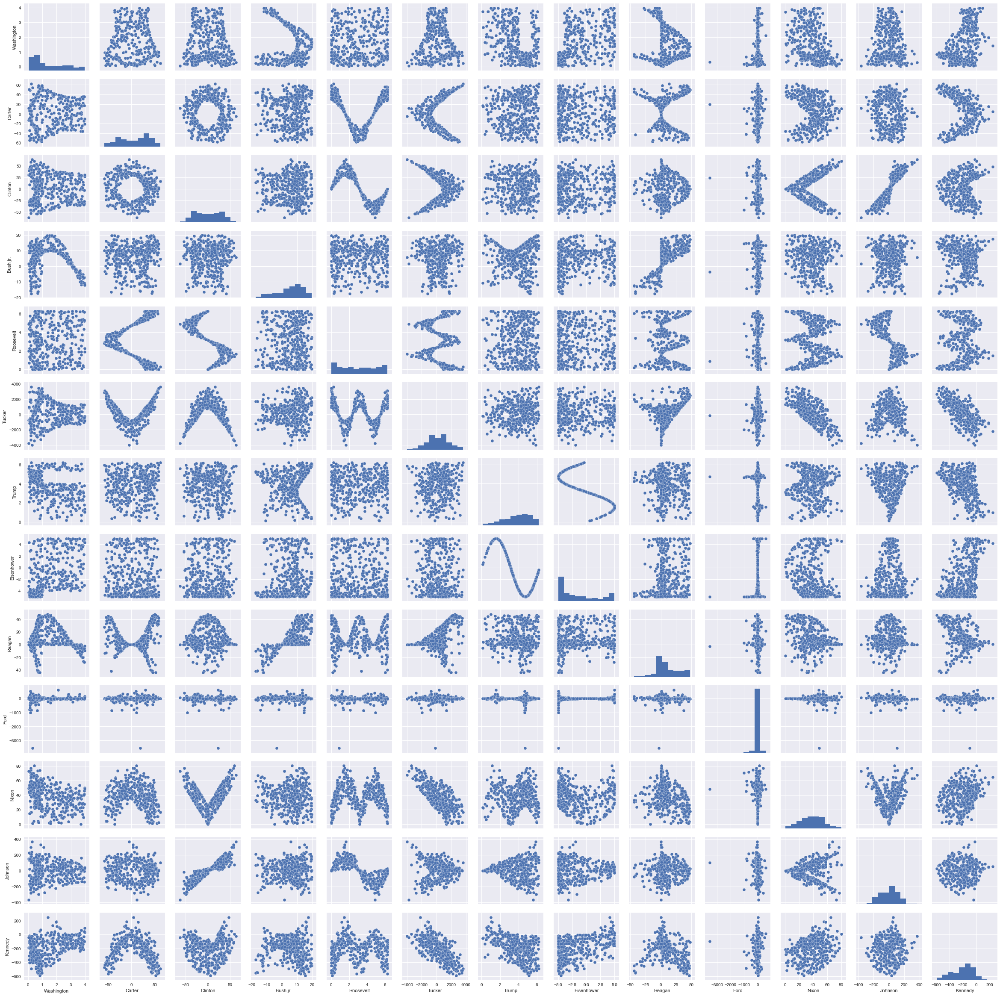

In [228]:
sns.pairplot(data.iloc[:, 1:])

Как видим, данные очень зависимы. Кроме того, можно заметить линейно неразделимые фигуры/зависмости. В связи с этим напрашивается использование ядерного PCA. Нужную размерность пространства подберем по кросс-валидации. Также судя по данным, в данном случае больше всего подойдут либо Гауссово, либо полиномиальное ядро, поэтому попробуем и то, и другое.

Но перед применением KernelPCA, проверим, что признаки попарно не сильно коррелированы и стандартизируем данные.

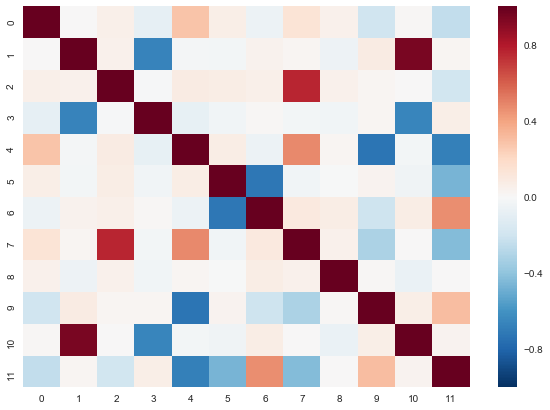

In [457]:
train_data = np.array(train_data, dtype=float)
train_data = pd.DataFrame(train_data)
R = train_data.corr(method='spearman')
plt.figure(figsize=(10, 7))
sns.heatmap(R, vmin=-1, vmax=1, cmap='RdBu_r');

Как видим, признаки не очень коррелированы. Сделаем стандартизацию

In [458]:
train_data = np.array(train_data)
test_data = np.array(test_data)
test_data -= np.min(train_data, axis=0)
test_data /= (np.max(train_data, axis=0) - np.min(train_data, axis=0))
train_data -= np.min(train_data, axis=0)
train_data /= (np.max(train_data, axis=0) - np.min(train_data, axis=0))
# test_data -= np.mean(train_data, axis=0)
# test_data /= np.std(train_data, axis=0)
# train_data -= np.mean(train_data, axis=0)
# train_data /= np.std(train_data, axis=0)

Посмотрим на KernelPCA с Гауссовым ядром. Заметим, что так как мы переводим изначальное пр-во в некоторое другое нелинейным преобразованием, то размерность нового про-ва может быть больше, чем размерность исходного.

In [459]:
train_data = np.array(train_data)
train_targets = np.array(train_targets)

folds = KFold(len(train_data), n_folds=5, shuffle=True, random_state=0)
ns = np.arange(1, 200, 5)
rmses_ns = []

for n in ns:
    rmses = []
    for fold in folds:
        kpca = KernelPCA(n_components=n, kernel='rbf')
        kpca.fit(train_data[fold[0]])
        train = kpca.transform(train_data[fold[0]])
        test = kpca.transform(train_data[fold[1]])
        lr = LinearRegression()

        lr.fit(train, train_targets[fold[0]])
        predictions = lr.predict(test)
        rmses.append(np.sqrt(mean_squared_error(predictions, train_targets[fold[1]])))
    print('n = {}, rmse = {}'.format(n, np.mean(rmses)))
    rmses_ns.append(np.mean(rmses))

n = 1, rmse = 0.9804182289209852
n = 6, rmse = 0.9122164500251015
n = 11, rmse = 0.7722973556036388
n = 16, rmse = 0.7062454255588803
n = 21, rmse = 0.6760224533578262
n = 26, rmse = 0.6511099694489795
n = 31, rmse = 0.6245299887557988
n = 36, rmse = 0.6180277168441141
n = 41, rmse = 0.6296666605528479
n = 46, rmse = 0.621062692548872
n = 51, rmse = 0.6069156968560325
n = 56, rmse = 0.5970684602358561
n = 61, rmse = 0.6149005397277081
n = 66, rmse = 0.6088039785489086
n = 71, rmse = 0.600846621078818
n = 76, rmse = 0.6074116071575134
n = 81, rmse = 0.6083502549127273
n = 86, rmse = 0.6071041349102124
n = 91, rmse = 0.5937876561776034
n = 96, rmse = 0.5566598984599452
n = 101, rmse = 0.5593555197278528
n = 106, rmse = 0.5732527432029388
n = 111, rmse = 0.6175878988195871
n = 116, rmse = 0.6878444984259378
n = 121, rmse = 0.6803214381676612
n = 126, rmse = 0.6040429412102102
n = 131, rmse = 0.5935937742925248
n = 136, rmse = 0.5813627455339927
n = 141, rmse = 0.5897102783409848
n = 146, 

KernelPCA с полиномиальным ядром

In [460]:
train_data = np.array(train_data)
train_targets = np.array(train_targets)

folds = KFold(len(train_data), n_folds=10, shuffle=True, random_state=0)
ns = np.arange(1, 92, 5)
rmses_ns = []

for n in ns:
    rmses = []
    for fold in folds:
        kpca = KernelPCA(n_components=n, kernel='poly', degree=2)
        kpca.fit(train_data[fold[0]])
        train = kpca.transform(train_data[fold[0]])
        test = kpca.transform(train_data[fold[1]])
        lr = LinearRegression()

        lr.fit(train, train_targets[fold[0]])
        predictions = lr.predict(test)
        rmses.append(np.sqrt(mean_squared_error(predictions, train_targets[fold[1]])))
    print('n = {}, rmse = {}'.format(n, np.mean(rmses)))
    rmses_ns.append(np.mean(rmses))

n = 1, rmse = 0.9724314593801229
n = 6, rmse = 0.9102451090554261
n = 11, rmse = 0.7983794250706513
n = 16, rmse = 0.6965651650784455
n = 21, rmse = 0.6658014641026787
n = 26, rmse = 0.659796664550387
n = 31, rmse = 0.6242680872516129
n = 36, rmse = 0.6136647376119415
n = 41, rmse = 0.6196745780975859
n = 46, rmse = 0.6138933556373048
n = 51, rmse = 0.6055657142131228
n = 56, rmse = 0.6038495975296253
n = 61, rmse = 0.5982199241582795
n = 66, rmse = 0.5940311473152174
n = 71, rmse = 0.6122749222205321
n = 76, rmse = 0.6158487224235935
n = 81, rmse = 0.6977920351213499
n = 86, rmse = 0.605839492299032
n = 91, rmse = 0.6368764950893638


Видим, что Гауссово ядро дало более хороший результат (при n ~ 95-105). Поэтому будем использовать его.

In [464]:
kpca = KernelPCA(n_components=105, kernel='rbf')
kpca.fit(train_data)
train = kpca.transform(train_data)
test = kpca.transform(test_data)
lr = LinearRegression()
lr.fit(train, train_targets)
predictions = lr.predict(test)
print(np.sqrt(mean_squared_error(predictions, test_targets)))

0.5721822161545633


Посмотрим на результат обычной линейной регрессии на исходных (стандартизированных) признаках

In [462]:
lr = LinearRegression()
lr.fit(train_data, train_targets)
predictions = lr.predict(test_data)
print(mean_squared_error(predictions, test_targets))

0.6992614646330688


Видим, что с применением ядерного PCA качество значительно возрасло

## Задача 4

In [132]:
from sklearn.datasets import fetch_olivetti_faces

In [352]:
data = fetch_olivetti_faces()
data, images, targets = data['data'], data['images'], data['target']

Посмотрим на картинки

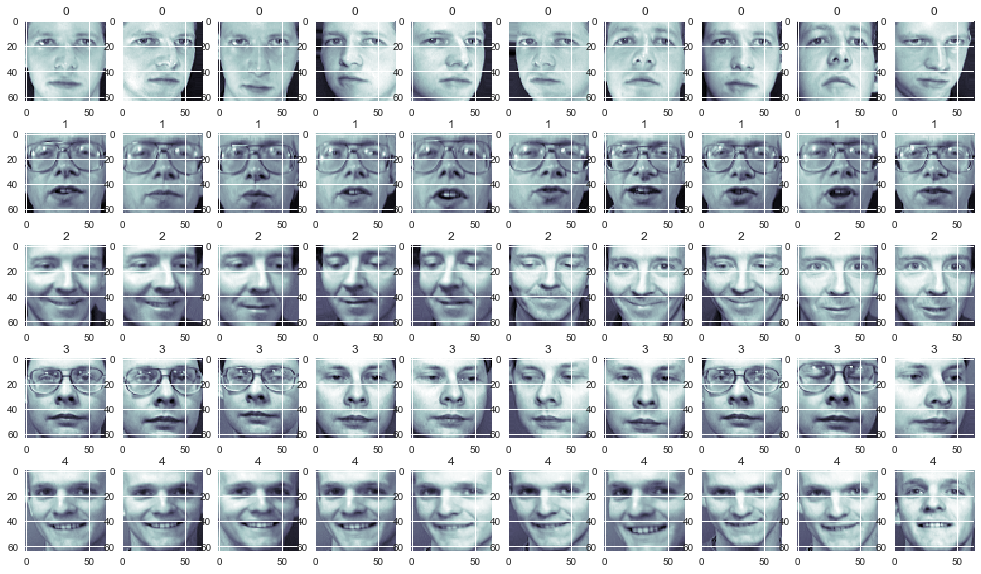

In [153]:
plt.figure(figsize=(17, 10))
for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(images[i*10 + j], cmap=plt.cm.bone)
        plt.title(i)
        
plt.show()

Чтобы посмотреть после какого k картинки теряют различие будем делать PCA и пытаться восстановить картинку обратно.

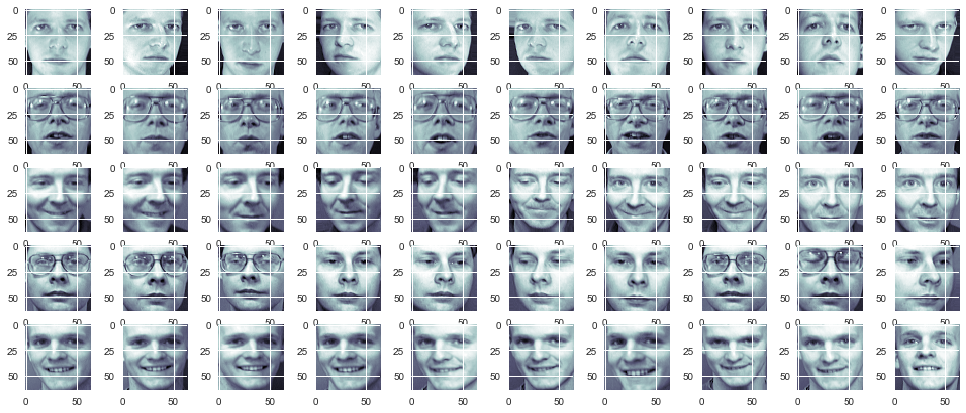

In [184]:
pca = IncrementalPCA(n_components=1024)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

Видим, что исходные изображения идеально (кажется) восстанавливаются. Попробуем k поменьше.

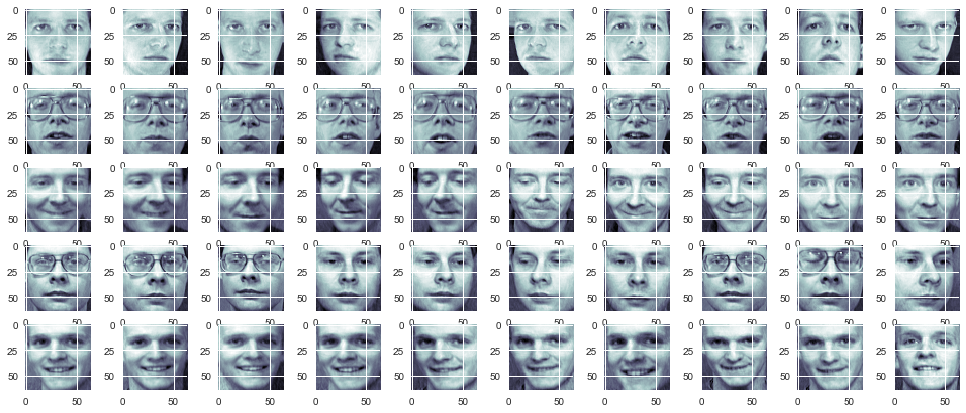

In [183]:
pca = IncrementalPCA(n_components=256)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

И здесь аналогичный результат.

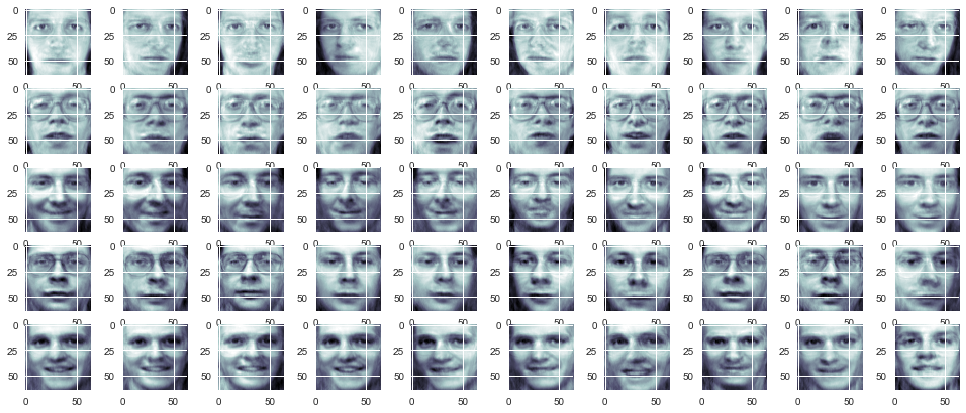

In [186]:
pca = IncrementalPCA(n_components=64)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

Здесь уже можно заметить, что появляются неточности и оригинальная картинка восстанавливается уже не так хорошо.

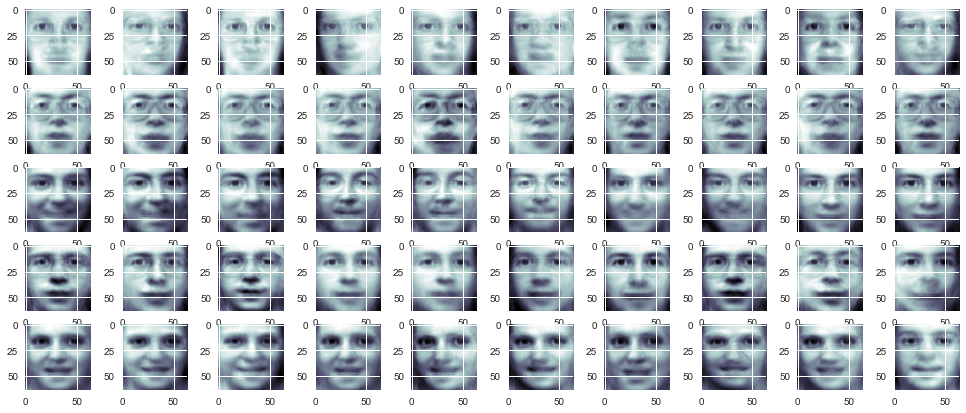

In [189]:
pca = IncrementalPCA(n_components=16)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

Здесь результат получился еще хуже. Хотя индивидуальные черты все еще видны.

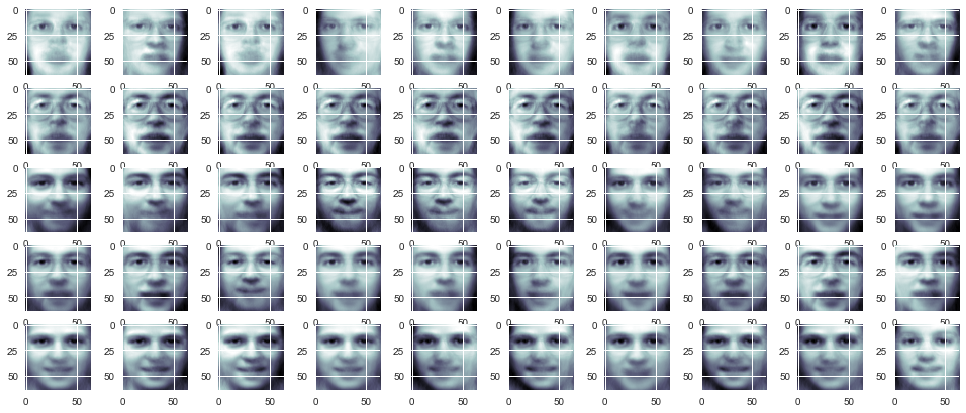

In [190]:
pca = IncrementalPCA(n_components=8)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

Некоторые индивидуальные черты все еще видны - например, очки, форма глаз и улыбка. Берем k еще меньше

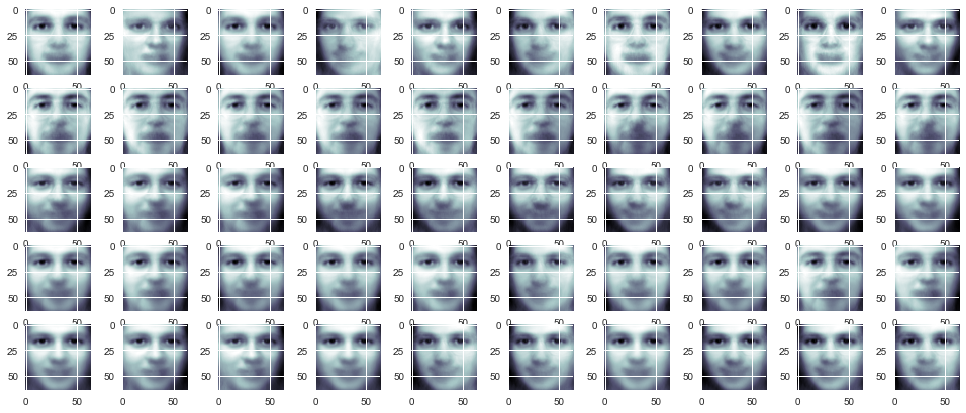

In [192]:
pca = IncrementalPCA(n_components=4)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

Здесь уже, кажется, не осталось индивидуальных различий. Посмотрим при k = 2

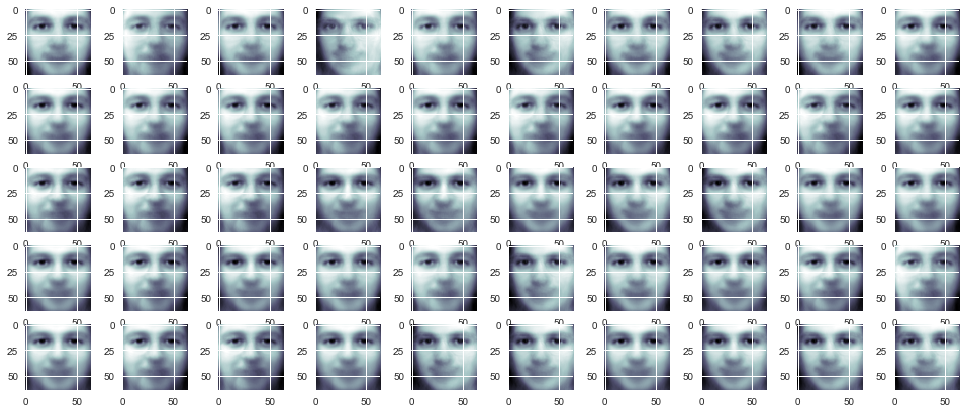

In [193]:
pca = IncrementalPCA(n_components=2)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

Здесь уже, конечно, не осталось никаких различий. Также можно по картинкам можно заметить, что главных компонент именно 2. Ну и спроецируем на одномерное пространство

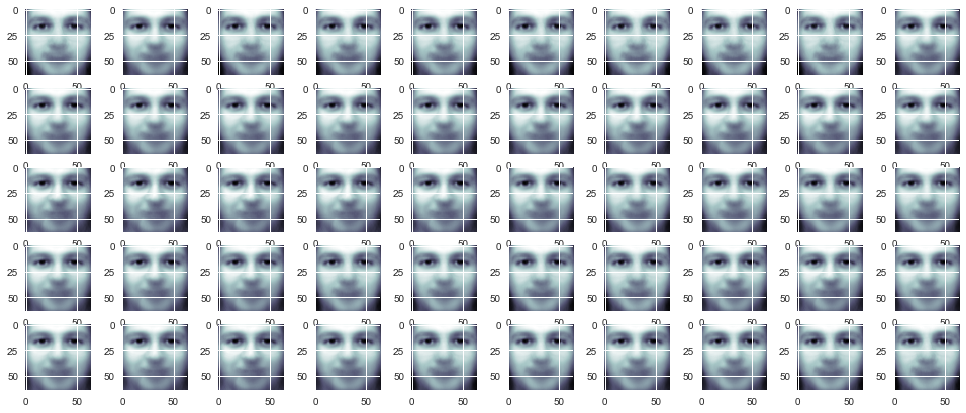

In [194]:
pca = IncrementalPCA(n_components=1)
small_data = pca.fit_transform(data)
big_data = pca.inverse_transform(small_data)
plt.figure(figsize=(17,7))

for i in range(5):
    for j in range(10):
        plt.subplot(5, 10, i*10 + j + 1)
        plt.imshow(big_data[i*10 + j].reshape(64, 64), cmap=plt.cm.bone)
        
plt.show()

Как и ожидалось, видим лишь одно лицо.

Визуализируем данные на плоскости при помощи различных методов понижения размерности.

**t-SNE**

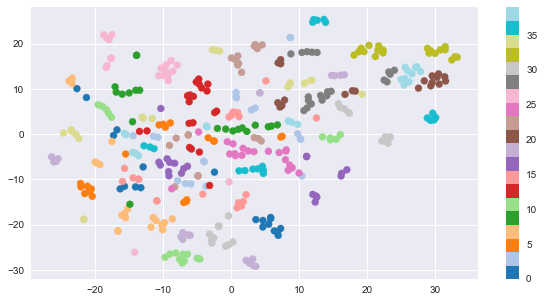

In [221]:
plt.figure(figsize=(10, 5))
tsne = TSNE(n_components=2)
data_tsne = tsne.fit_transform(data)
cmap = cm.get_cmap('tab20', 40)
sc = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=targets, cmap=cmap)
plt.colorbar(sc)
plt.show()

**PCA**

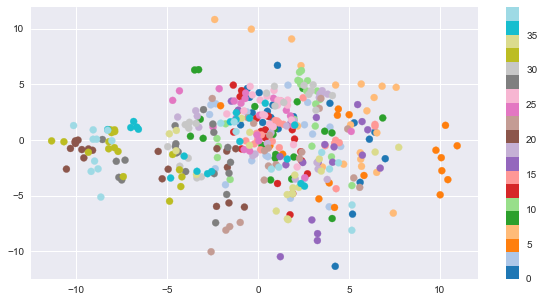

In [222]:
pca = IncrementalPCA(n_components=2)
data_pca = pca.fit_transform(data)

plt.figure(figsize=(10, 5))
cmap = cm.get_cmap('tab20', 40)
sc = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=targets, cmap=cmap)
plt.colorbar(sc)
plt.show()

**Isomap**

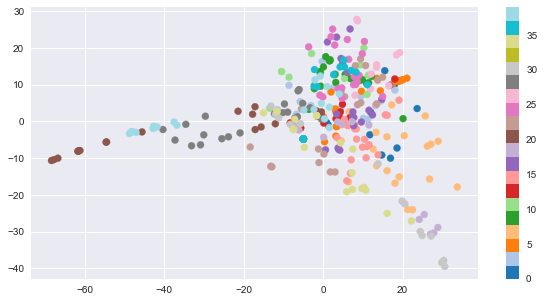

In [353]:
isomap = Isomap(n_neighbors=4, n_components=2)
data_isomap = isomap.fit_transform(data)
plt.figure(figsize=(10, 5))
cmap = cm.get_cmap('tab20', 40)
sc = plt.scatter(data_isomap[:, 0], data_isomap[:, 1], c=targets, cmap=cmap)
plt.colorbar(sc)
plt.show()

**LDA**

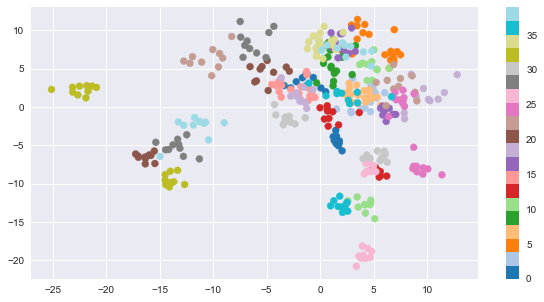

In [355]:
lda = LDA(n_components=2)
data_lda = lda.fit_transform(data, targets)

plt.figure(figsize=(10, 5))
cmap = cm.get_cmap('tab20', 40)
sc = plt.scatter(data_lda[:, 0], data_lda[:, 1], c=targets, cmap=cmap)
plt.colorbar(sc)
plt.show()

t-SNE пытается сохранить пропорции расстояний и не сильно штрафует за увеличение расстояний в маломерном пространстве, именно поэтому если точки образовывали некие кластеры в исходном пространстве, то они будут образовывать кластеры и в двумерном. PCA же минимизирует расстояния от объектов до их проекций на новое пространство, что не влечет кластеризацию.

## Задача 5

Очень долго пыталась понять, что нужно сделать в задании, возможно поняла неправильно. У нас 3 класса, сначала первый класс отделяем от остальных, а потом оставшееся классифицируем с помощью KNN.

In [528]:
data = pd.read_csv('hw11t5.csv')
data.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0,3.0,154.821499,5.782582,-3.918036,-1.400880,3.945351,2.815372,0.403212,-0.993077,0.191118,-12.357041,0.197025,-5.040347,1.056376e+25,0.946656,-80.043312
1,1,3.0,70.860971,3.590312,-0.640982,8.150033,0.770168,-7.692933,1.272137,-0.832262,0.211284,1.679167,-0.992891,0.838220,9.920627e+03,0.997701,8.345960
2,2,3.0,57.396471,2.232988,0.017323,4.791453,0.020102,0.555192,-5.698161,0.861783,-0.053746,1.403360,0.094688,9.101261,1.381784e+00,-0.288042,53.346486
3,3,2.0,187.208620,4.991852,-0.174600,8.288949,1.139516,3.626264,-10.823121,-0.153223,0.085406,-1.167043,0.617928,-0.247962,3.877774e+05,0.981043,57.129222
4,4,1.0,60.916377,4.928733,-2.434158,-0.227966,2.434237,6.837928,-4.609124,-0.999967,0.180764,-6.294473,-0.812003,1.231482,1.220270e+04,0.898770,-23.988305


В качестве теста возьмем произвольные 150 объектов.

In [529]:
indeces_test = np.random.choice(np.arange(len(data)), 150)
indeces_train = np.setdiff1d(np.arange(len(data)), indeces_test)
train_data = data.iloc[indeces_train, 2:]
test_data = data.iloc[indeces_test, 2:]
train_targets = data.iloc[indeces_train, 1]
test_targets = data.iloc[indeces_test, 1]

Посмотрим на зависимости в данных

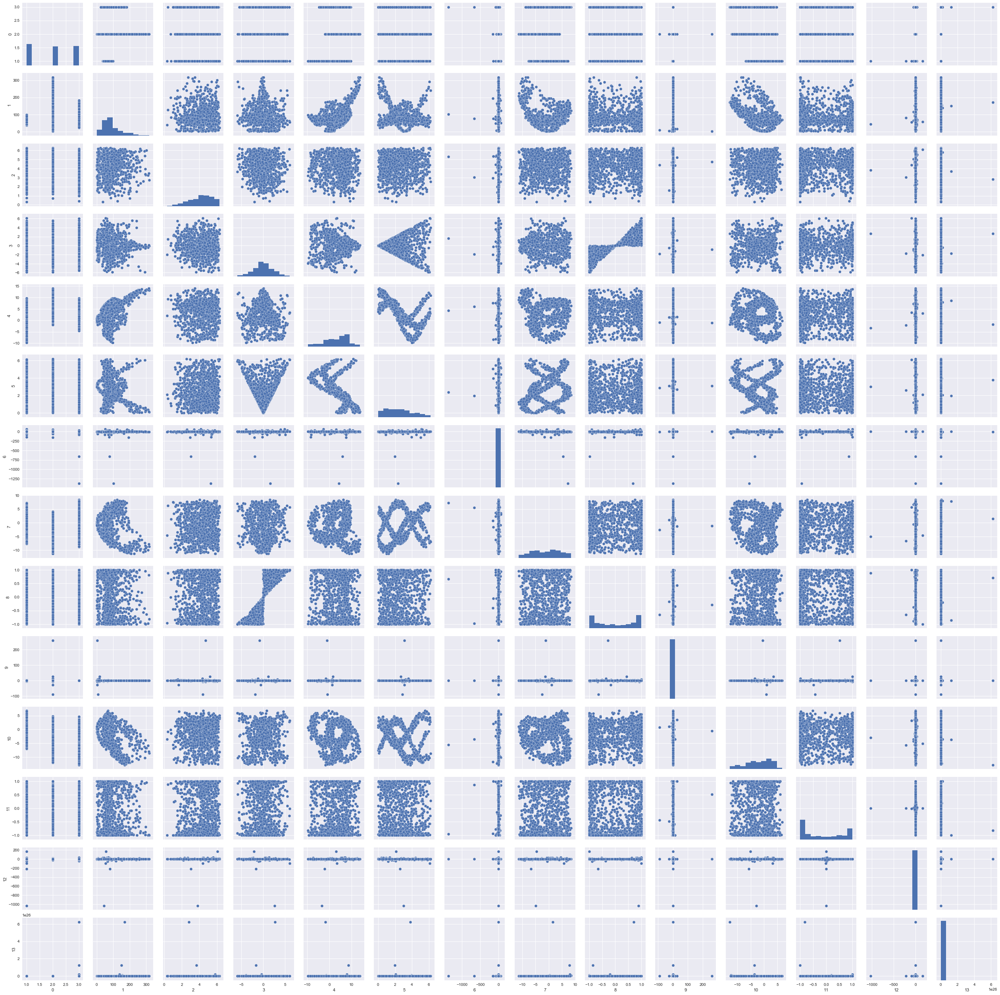

In [467]:
sns.pairplot(data.iloc[:,1:15])

Завидим много зависимостей в данных, в том числе нелинейных

Сначала визуализируем данные с помощью нескольких методов понижения размерности

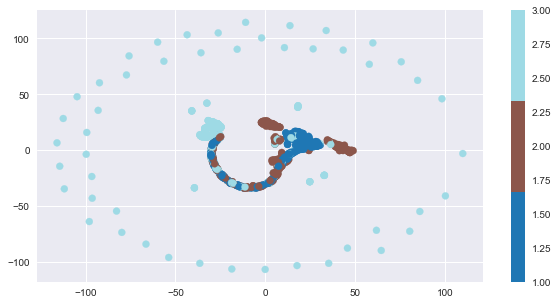

In [530]:
plt.figure(figsize=(10, 5))
tsne = TSNE(n_components=2)
data_tsne = tsne.fit_transform(train_data)
cmap = cm.get_cmap('tab20', 3)
sc = plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=train_targets, cmap=cmap)
plt.colorbar(sc)
plt.show()

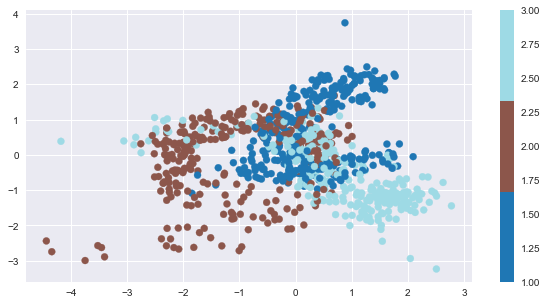

In [532]:
lda = LDA(n_components=2)
data_lda = lda.fit_transform(train_data, train_targets)

plt.figure(figsize=(10, 5))
cmap = cm.get_cmap('tab20', 3)
sc = plt.scatter(data_lda[:, 0], data_lda[:, 1], c=train_targets, cmap=cmap)
plt.colorbar(sc)
plt.show()

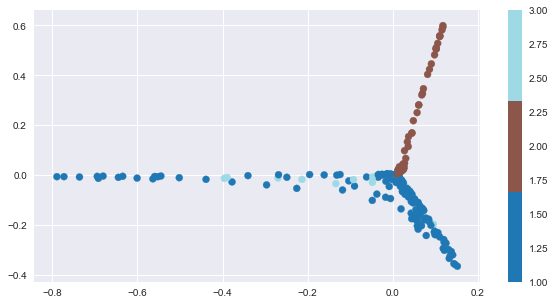

In [533]:
pca = KernelPCA(n_components=2, kernel='rbf', gamma=0.01)
data_pca = pca.fit_transform(train_data)

plt.figure(figsize=(10, 5))
cmap = cm.get_cmap('tab20', 3)
sc = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=train_targets, cmap=cmap)
plt.colorbar(sc)
plt.show()

Попробуем отделить класс 2(коричневый) с помощью логистической регрессии в разных пространствах.

Пр-во, полученное с помощью KernelPCA, размерности 2

In [547]:
new_targets = np.zeros_like(train_targets)
new_targets[np.where(train_targets==2)[0]] = 1

pca = KernelPCA(n_components=2, kernel='rbf', gamma=0.01)
data_pca = pca.fit(train_data)
train_pca = pca.transform(train_data)
test_pca = pca.transform(test_data)

lr = LogisticRegression()
lr.fit(train_pca, new_targets)
pred = lr.predict(train_pca)
print('accuracy on train: ', accuracy_score(pred, new_targets))

new_test_targets = np.zeros_like(test_targets)
new_test_targets[np.where(test_targets==2)[0]] = 1
pred = lr.predict(test_pca)
print('accuracy on test: ', accuracy_score(pred, new_test_targets))

accuracy on train:  0.7027972027972028
accuracy on test:  0.72


Пр-во, полученное с помощью KernelPCA, размерности 100

In [548]:
pca = KernelPCA(n_components=100, kernel='rbf', gamma=0.01)
pca.fit(train_data)
train_pca = pca.transform(train_data)
test_pca = pca.transform(test_data)

lr = LogisticRegression()
lr.fit(train_pca, new_targets)
pred = lr.predict(train_pca)
print('accuracy on train: ', accuracy_score(pred, new_targets))

new_test_targets = np.zeros_like(test_targets)
new_test_targets[np.where(test_targets==2)[0]] = 1
pred = lr.predict(test_pca)
print('accuracy on test: ', accuracy_score(pred, new_test_targets))

accuracy on train:  0.7599067599067599
accuracy on test:  0.74


Пр-во, полученное с помощью LDA

In [549]:
lda = LDA(n_components=2)
lda.fit(train_data, train_targets)
train_lda = lda.transform(train_data)
test_lda = lda.transform(test_data)

lr = LogisticRegression()
lr.fit(train_lda, new_targets)
pred = lr.predict(train_lda)
print('accuracy on train: ', accuracy_score(pred, new_targets))

new_test_targets = np.zeros_like(test_targets)
new_test_targets[np.where(test_targets==2)[0]] = 1
pred = lr.predict(test_lda)
print('accuracy on test: ', accuracy_score(pred, new_test_targets))


accuracy on train:  0.824009324009324
accuracy on test:  0.88


Лучшее значение accuracy получается при использование LDA. Теперь классифицируем оставшуюся выборку

In [556]:
from sklearn.neighbors import KNeighborsClassifier
res_test_data_lda = test_lda[pred == 0]
res_test_targets_lda = test_targets[pred == 0]

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(train_lda, train_targets)
predict = knn.predict(test_lda)
predict[pred==1] = 2


print('result accuracy on test: ', accuracy_score(predict, test_targets))


result accuracy on test:  0.7666666666666667


Получили следующие предсказания

In [559]:
predict, np.array(test_targets)

(array([1., 1., 1., 3., 1., 3., 1., 1., 2., 2., 3., 2., 3., 1., 2., 1., 1.,
        1., 3., 1., 2., 3., 2., 2., 2., 3., 1., 3., 1., 2., 1., 1., 3., 1.,
        2., 1., 1., 3., 2., 1., 1., 2., 2., 2., 2., 1., 1., 2., 2., 1., 2.,
        2., 3., 1., 2., 3., 1., 1., 3., 1., 1., 2., 3., 3., 2., 3., 1., 1.,
        2., 2., 2., 1., 1., 3., 3., 2., 2., 2., 3., 2., 3., 1., 2., 1., 1.,
        1., 2., 1., 1., 3., 3., 2., 1., 1., 2., 1., 1., 2., 1., 3., 2., 3.,
        3., 3., 1., 3., 2., 1., 3., 2., 3., 3., 3., 1., 3., 1., 3., 2., 3.,
        1., 2., 3., 1., 3., 1., 3., 3., 1., 3., 2., 2., 1., 2., 1., 1., 1.,
        1., 2., 1., 2., 3., 3., 2., 1., 1., 1., 1., 1., 1., 2.]),
 array([3., 1., 3., 1., 2., 2., 1., 1., 2., 2., 3., 2., 3., 1., 2., 1., 3.,
        1., 3., 3., 2., 3., 2., 2., 2., 3., 1., 3., 1., 3., 1., 3., 3., 2.,
        1., 3., 2., 3., 3., 1., 2., 2., 2., 2., 2., 1., 1., 3., 1., 3., 2.,
        2., 1., 1., 2., 3., 1., 1., 3., 1., 3., 3., 3., 3., 3., 1., 3., 3.,
        2., 2., 3., 1.